<h1 style = "font-size:3rem;color:darkcyan"> K-Means Clustering  </h1>
Clustering music based on genre (country, disco, hiphop, and raggae) using k-means clustering

In [32]:
# import libraries
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import sklearn
import IPython.display as Ipd
import librosa

In [3]:
# import the dataset (extracted features) saved in a .csv
dataset = pd.read_csv(r'dataset.csv' , index_col=0)
dataset

,sbw,scon,zcr,rms,tg,filename
0,1.222329,0.864234,0.177828,2.038501,2.379083,country.00000.wav
1,1.238002,0.451622,0.673754,1.703651,2.812887,country.00001.wav
2,0.661673,0.310009,-0.743647,0.144000,0.826554,country.00002.wav
3,-0.240139,1.060749,-0.023306,1.213736,0.654642,country.00003.wav
4,1.302863,0.321903,0.631281,1.315193,2.560773,country.00004.wav
...,...,...,...,...,...,...
395,1.001297,-0.748348,0.006054,0.372957,0.373265,reggae.00095.wav
396,-1.873327,-1.124472,-0.670458,0.390389,0.013986,reggae.00096.wav
397,-0.655795,0.700545,-0.273649,-0.512144,2.140940,reggae.00097.wav
398,-0.086576,-0.245017,-1.014102,-0.015369,-0.694718,reggae.00098.wav


In [30]:
filenames = np.array(dataset)[:, -1]
features = np.array(dataset)[:,:-1]
features.shape

(400, 5)

C:\Users\helme\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


<IPython.core.display.Javascript object>


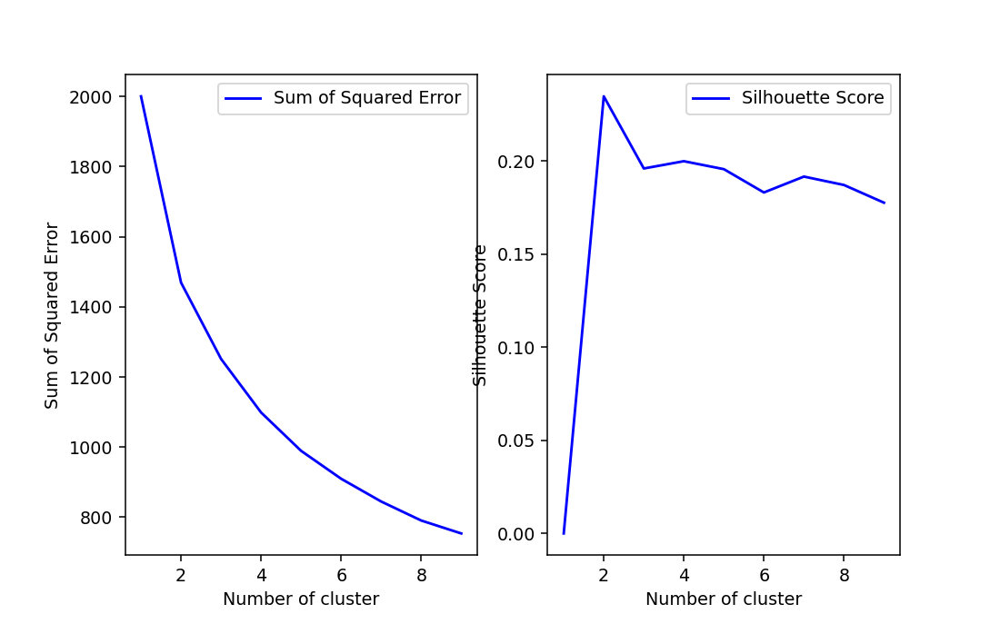

In [50]:
# finding optimal number of clusters using elbow method

sse = [] #sum of squared errors
sil_coeff = [] #silhouette coefficients

range_n_clusters = range(1, 10)

for k in range_n_clusters:
    kmeans = sklearn.cluster.KMeans(n_clusters=k, max_iter=1000).fit(features)
    
    sse.append(kmeans.inertia_) # Inertia: Sum of distances of samples to their closest cluster center
    
    if k < 2: # we need at least 2 clusters to compute the silhouette coefficient
        sil_coeff.append(0) # setting the silhouette coefficient to 0 for meaningless cases
    else:
        label = kmeans.labels_
        sil_coeff.append(sklearn.metrics.silhouette_score(features, label, metric='euclidean'))
         
fig = plt.figure(figsize=(8,5))
fig.add_subplot(121)
plt.plot(range_n_clusters, sse,'b-',label='Sum of Squared Error')
plt.xlabel("Number of cluster")
plt.ylabel("Sum of Squared Error")
plt.legend()
fig.add_subplot(122)
plt.plot(range_n_clusters, sil_coeff,'b-',label='Silhouette Score')
plt.xlabel("Number of cluster")
plt.ylabel("Silhouette Score")
plt.legend()
plt.show()

In [82]:
from sklearn.cluster import KMeans
#Working wiht 5 clusters
clusters = 3

kmeans = sklearn.cluster.KMeans(n_clusters=clusters, random_state=17)

#we are using features 
kmeans = kmeans.fit(features)

#this will generate labels as integer numbers ranging from 0 to number of clusters -1
prediction = kmeans.predict(features)


In [83]:
prediction

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 0, 0, 1, 0, 1, 1,
       2, 0, 2, 2, 2, 2, 1, 2, 2, 1, 2, 1, 2, 2, 1, 2, 2, 2, 1, 2, 2, 2,
       1, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 1, 1, 1, 2, 2, 2, 1, 2,
       2, 2, 1, 2, 0, 2, 2, 2, 2, 2, 2, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 2, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0,
       1, 0, 0, 0, 0, 0, 0, 2, 0, 1, 0, 0, 1, 1, 1, 2, 0, 0, 0, 0, 0, 0,
       1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 1, 1, 2, 0, 1, 1, 0, 2, 1, 2, 1, 0, 1, 1, 0, 1, 1, 1, 1,
       1, 1, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0, 1,
       2, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 2, 0,
       0, 1, 2, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 2, 1, 1, 1, 1, 1, 2, 1, 0,
       1, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0,
       1, 1, 0, 0, 0, 0, 0, 0, 2, 0, 1, 0, 1, 1, 2,

<IPython.core.display.Javascript object>


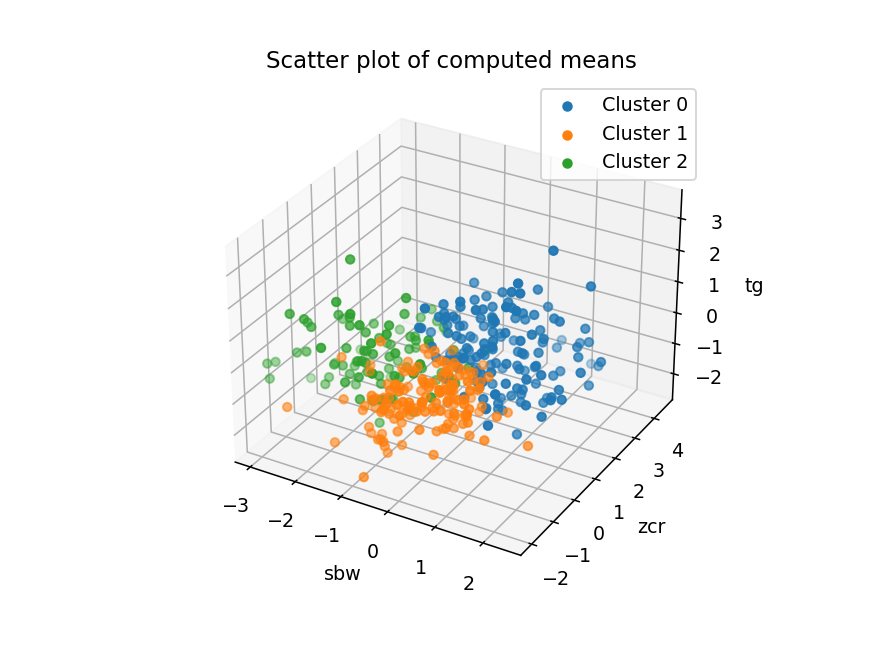

In [84]:
f_dict = {'sbw' : 0, 'scon': 1, 'zcr' : 2, 'rms': 3, 'tg' : 4}
# choose three features

f1 = 'sbw'
f2 = 'zcr'
f3 = 'tg'

# plot the features
%matplotlib notebook
#fig = plt.figure(figsize = (15, 9))
ax = plt.axes(projection ="3d")
for i in range(clusters):
    ax.scatter3D(features[np.where(prediction == i),f_dict[f1]],
                 features[np.where(prediction == i),f_dict[f2]],
                 features[np.where(prediction == i),f_dict[f3]], 
                 label = f'Cluster {i}')

#plt.scatter(feature2[:,0], feature2[:,1])
plt.title('Scatter plot of computed means')
ax.set_xlabel(f1)
ax.set_ylabel(f2)
ax.set_zlabel(f3)
ax.legend()

In [85]:
# Show and listen to audio files insdide each class
selected_cluster = 2
selected_cluster_idxs = np.asarray(np.where(prediction == selected_cluster)).flatten()
sr = 48000

for i in range(np.size(selected_cluster_idxs)):
    print('data/'+filenames[selected_cluster_idxs[i]])
    signal, sr = librosa.load('data/'+filenames[selected_cluster_idxs[i]], mono=True, duration=3)
    Ipd.display(Ipd.Audio(signal, rate=sr))

data/country.00010.wav


data/country.00011.wav


data/country.00012.wav


data/country.00015.wav


data/country.00016.wav


data/country.00017.wav


data/country.00018.wav


data/country.00019.wav


data/country.00020.wav


data/country.00021.wav


data/country.00022.wav


data/country.00023.wav


data/country.00024.wav


data/country.00025.wav


data/country.00026.wav


data/country.00027.wav


data/country.00028.wav


data/country.00029.wav


data/country.00030.wav


data/country.00031.wav


data/country.00032.wav


data/country.00033.wav


data/country.00035.wav


data/country.00036.wav


data/country.00037.wav


data/country.00044.wav


data/country.00046.wav


data/country.00047.wav


data/country.00048.wav


data/country.00049.wav


data/country.00051.wav


data/country.00052.wav


data/country.00054.wav


data/country.00056.wav


data/country.00057.wav


data/country.00059.wav


data/country.00060.wav


data/country.00061.wav


data/country.00063.wav


data/country.00064.wav


data/country.00065.wav


data/country.00067.wav


data/country.00068.wav


data/country.00069.wav


data/country.00070.wav


data/country.00071.wav


data/country.00072.wav


data/country.00073.wav


data/country.00074.wav


data/country.00076.wav


data/country.00077.wav


data/country.00078.wav


data/country.00079.wav


data/country.00083.wav


data/country.00084.wav


data/country.00085.wav


data/country.00087.wav


data/country.00088.wav


data/country.00089.wav


data/country.00091.wav


data/country.00093.wav


data/country.00094.wav


data/country.00095.wav


data/country.00096.wav


data/country.00097.wav


data/country.00098.wav


data/disco.00020.wav


data/disco.00039.wav


data/disco.00047.wav


data/disco.00081.wav


data/disco.00086.wav


data/disco.00088.wav


data/hiphop.00020.wav


data/hiphop.00040.wav


data/hiphop.00044.wav


data/hiphop.00055.wav


data/hiphop.00061.wav


data/hiphop.00094.wav


data/reggae.00000.wav


data/reggae.00007.wav


data/reggae.00008.wav


data/reggae.00010.wav


data/reggae.00013.wav


data/reggae.00040.wav


data/reggae.00041.wav


data/reggae.00043.wav


data/reggae.00046.wav


data/reggae.00047.wav


data/reggae.00060.wav


data/reggae.00068.wav


data/reggae.00070.wav


data/reggae.00083.wav


data/reggae.00085.wav


data/reggae.00091.wav


data/reggae.00092.wav


data/reggae.00093.wav


data/reggae.00094.wav


data/reggae.00097.wav


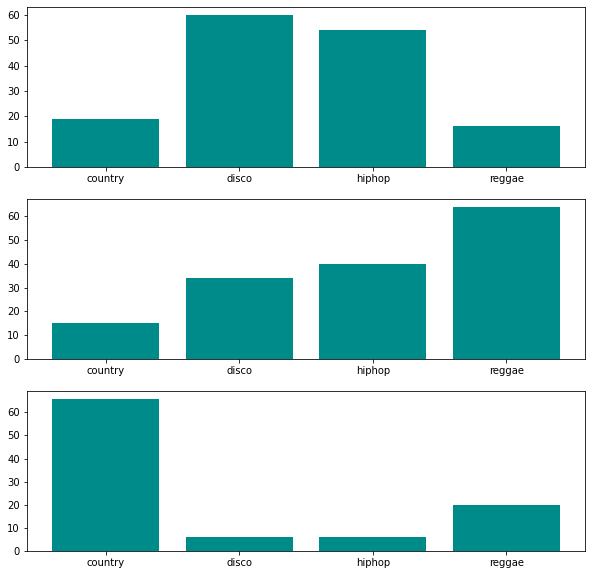

In [108]:
# create box plots to see what genre's end up in what cluster
%matplotlib inline
plt.figure(figsize=(10, 10))
genres = ['country', 'disco', 'hiphop', 'reggae']

num_bins = len(genres)

for i in range(clusters ):
    # check if there is a match
    selected_cluster_idxs = np.asarray(np.where(prediction == i)).flatten()
    n_matches = np.zeros(len(genres))
    
    # go through whole cluster
    for j in range(len(selected_cluster_idxs)):
        for k in range(len(genres)):
            if filenames[selected_cluster_idxs[j]].find(genres[k]) != -1:
                n_matches[k] += 1 
        
    plt.subplot(clusters,1, i + 1)
    
    plt.bar(np.arange(len(genres)), n_matches, color= 'darkcyan')
    plt.xticks(np.arange(len(genres)), genres);